<div style="border:solid Chocolate 2px; padding: 40px">

<b>Игорь, приветствую!</b>

Буду рада с тобой познакомиться. Меня зовут Евгения Маракова и я буду ревьюером твоего проекта. Если ты не против, то предлагаю общаться на "ты":) Если удобнее на "вы", то нет проблем, только скажи об этом.

В процессе работы ты встретишь комментарии <font color='green'>зеленого</font>, <font color='gold'>желтого</font> и <font color='red'>красного</font> цветов. Что они значат, смотри ниже:
    <br/>

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

<br/>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Решение на этом шаге станет еще лучше, если внести небольшие коррективы.
</div>


<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
 Решение на этом шаге требует существенной переработки и внесения правок. Напоминаю, что проект не может быть принят с первого раза, если ревью содержит комментарии, рекомендующие доработать шаги.
</div>
    
Увидев мой комментарий, не удаляй его, он будет очень полезен в случае повторной проверки работы😊
    
Свой комментарий помечай так, как показано ниже, тогда нам будет легче вести диалог, а мне выполнить повторную проверку проекта.
    <div class="alert alert-info"> <b>Комментарий студента: </b> </div>
    


# Исследование рынка заведений общественного питания в Москве.

Задача — подготовить исследование рынка Москвы, найти интересные особенности которые в будущем помогут в выборе подходящего места для открыть заведение общественного питания.

- Первый этап - изучение общий информации.
- Второй этап - предобработка данных.
- Третий этап - анализ данных.
- Четвертый этап - исследование перспектив открытия кофейни.
- Пятый этап - общий вывод. 


##   Изучение общий информации. 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import folium as fo
from folium import Marker, Map
from folium.plugins import MarkerCluster
import json

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('C:\\Users\\User\\Documents\\Phyton\\moscow_places.csv')
display(data.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
total = len(data['address'])
print('Всего заведений:',total) 
data.info()

Всего заведений: 8406
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Среди данных у нас есть:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat и lng — широта и долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0(не является сетевым) или 1(является сетевым), которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

district — административный район, в котором находится заведение;

seats — количество посадочных мест.

Большинство данных несут в себе информацию о названии или категории и являются типом object, остальные вещественные числа с долготой и широтой, рейтингом и ценами, их тип float. В колонки chain находится категории выраженная в целых числах 0 и 1, ее тип int.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер, ты отлично познакомился с данными!
</div>


## Предобработка данных.

Проверка на дубликаты: 

In [4]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Проверка на дубли выполнена верно!
</div>


<div class="alert alert-info"> <b>Комментарий студента:</b> 
    
   Единственный способ найти неявные дубликаты эта сравнить количества адресов, после проверки некоторых из них оказалось что эта точки с большим количеством заведений либо торговые центры с фудкортами. Все остальные данные эта название заведений, там есть сетевые заведения их названия совпадают, либо категории, либо данные которые могут совпасть случайна такие как средний чек. Ну и если заведения находятся в одном здании логично что и координаты будут совпадать. </div>


In [5]:
data['address'].value_counts().head(15)
address_du1 = data.query('address == "Москва, проспект Вернадского, 86В"')
address_du2 = data.query('address == "Москва, Усачёва улица, 26"')
address_du3 = data.query('address == "Москва, Профсоюзная улица, 56"')
display(address_du1.head())
display(address_du2.head())
display(address_du3.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6531,Паrk фудхолл,"бар,паб","Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661639,37.480197,4.6,NaN,NaN,NaN,NaN,0,NaN
6532,I Need Doner,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 10:00...",55.661559,37.479887,4.9,NaN,Средний счёт:400–700 ₽,550.0,NaN,1,NaN
6534,Fibo Pasta & Ravioli,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.661638,37.480148,4.8,средние,Средний счёт:500–1000 ₽,750.0,NaN,1,NaN
6547,Сыроварня,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661718,37.479907,4.5,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,1,NaN
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661638,37.480148,4.7,NaN,NaN,NaN,NaN,0,NaN


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4007,Сыроварня,ресторан,"Москва, Усачёва улица, 26",Центральный административный округ,"пн-чт 11:00–23:00; пт,сб 11:00–00:00; вс 11:00...",55.727467,37.567612,4.5,высокие,Средний счёт:1500 ₽,1500.0,NaN,1,100.0
4027,Nafa grill,быстрое питание,"Москва, Усачёва улица, 26",Центральный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.727393,37.567619,4.6,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,100.0
4050,Frank by Баста,"бар,паб","Москва, Усачёва улица, 26",Центральный административный округ,"пн-чт 12:00–23:00; пт,сб 12:00–00:00; вс 12:00...",55.727273,37.567657,4.5,NaN,NaN,NaN,NaN,1,100.0
4060,Кофемания,ресторан,"Москва, Усачёва улица, 26",Центральный административный округ,"ежедневно, 07:30–00:00",55.727730,37.567667,4.4,NaN,NaN,NaN,NaN,1,100.0
4062,Жирок,ресторан,"Москва, Усачёва улица, 26",Центральный административный округ,"ежедневно, 09:00–00:00",55.727424,37.568095,4.5,NaN,NaN,NaN,NaN,0,100.0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6865,"Пироги по-домашнему, Халяль",быстрое питание,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.669739,37.553128,5.0,средние,NaN,NaN,NaN,0,86.0
6901,MamaMai,ресторан,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.669934,37.553326,4.4,NaN,Средний счёт:500–800 ₽,650.0,NaN,1,86.0
6920,Чайхона,ресторан,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.669616,37.552947,4.3,NaN,NaN,NaN,NaN,1,86.0
6925,Хинкали и Вино,ресторан,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–23:00",55.670210,37.551820,4.3,средние,NaN,NaN,NaN,1,86.0
6990,Kimpab,ресторан,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.669691,37.553072,4.2,NaN,NaN,NaN,NaN,1,86.0


Большого количества неявных дубликатов нет, если есть ошибки то их не большое количество и сильно исказить данные они не должны.

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Необходимо проверить датасет на неявные дубликаты. Неявные дубликаты могут появиться в случаях, когда данные собирались из разных источников или в системе были какие-то сбои при логировании.
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Если так детально рассматривать, то конечно, можно найти большое количество ошибок! Просто данная проверка является обязательной. Обычно проверяют неявные дубли, отдельно по столбцам.
</div>


In [6]:
#data.info()
print(data.isna().sum());

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Много пропусков из-за того что многие данные добавлены пользователями или найдены в общедоступных источниках поэтому могут являться не полными. Такие пропуски сложна заменить медианой или средним числом, а при удаление можно потерять много важной информации, в этом случии их лучше оставить как есть.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Верное решение! Заполнение или удаление пропусков исказит исследование.
</div>

In [7]:
#import re
categorize_street = ['улица',  'переулок', 'площадь', 'мост', 'тупик', 'проезд','бульвар', 'просека', 
                'проспект', 'набережная', 'шоссе', 'аллея', 'линия', 'квартал']
def street_address(row):
    for address_row in row.split(', '):
        for street in categorize_street:
            if address_row.lower().find(street)!= -1:
                return address_row
data['street'] = data['address'].apply(street_address)
display(data['street'].head(3));


0         улица Дыбенко
1         улица Дыбенко
2    Клязьминская улица
Name: street, dtype: object

In [8]:
def categorize_hours(row):
    try:
        if 'ежедневно, круглосуточно' in row:
            return True      
        elif '0' in row:
            return False
    except:
        return False

In [9]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Стоит вывести таблицу с добавленными столбцами, чтобы продемонстрировать сво труды:)
        
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

In [10]:
data['is_24/7'] = data['hours'].apply(categorize_hours)
display(data['is_24/7'].head(3));

0    False
1    False
2    False
Name: is_24/7, dtype: object

In [11]:
print(data['rating'].describe())
print('Аномалий в колонке rating нет.')
#data.info()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64
Аномалий в колонке rating нет.


In [12]:
data['seats'].describe()
#data.info()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Максимальное число в столбе seats слишком большое и далеко от средней, нужна посмотреть разброс на примере категорий заведений.

In [13]:
fig = px.line(data, # загружаем данные
              x='seats', # указываем столбец с данными для оси X
              y='category', # указываем столбец с данными для оси Y
              color='category', # обозначаем категорию для разделения цветом
              markers=True) # отображаем маркеры (точки) на графике
# оформляем график
fig.update_layout(title='Количество посадочных мест в заведениях по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категории заведений')
fig.show() # выводим график

Разброс слишом большой, поставим планку в 350 мест.

In [14]:
data_copy = data
data = data.query('seats.isna() | seats <= 350')
#data = data[(data['seats'] <= 350)]
print(data['seats'].describe());
#data.info()

count    4654.000000
mean       93.589600
std        78.946023
min         0.000000
25%        40.000000
50%        70.000000
75%       120.000000
max       350.000000
Name: seats, dtype: float64


In [15]:
fig = px.line(data, 
              x='seats', 
              y='category',
              color='category', 
              markers=True) 
fig.update_layout(title='Количество посадочных мест в заведениях по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категории заведений')
fig.show() 
print('Данных осталось:', (data['category'].count()*100/total).round(2),'%')
print('Данных удалили:', (100 - (data['category'].count()*100/total)).round(2),'%')

Данных осталось: 98.32 %
Данных удалили: 1.68 %


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, ты отлично поработал с аномалиями!
</div>



## Анализ данных.

In [16]:
category = (data.pivot_table(index=['category'], values='name', aggfunc='count')
            .sort_values(by='name', ascending=False).reset_index()
           )
display(category.style.set_caption('Количество объектов общественного питания по категориям')
    .set_table_styles([{'selector': 'caption', 'props': [('color', 'black'), ('font-size', '15px')]}])
       )

,category,name
0,кафе,2345
1,ресторан,1997
2,кофейня,1393
3,"бар,паб",741
4,пиццерия,624
5,быстрое питание,599
6,столовая,312
7,булочная,254


In [17]:
# строим столбчатую диаграмму 
fig = px.bar(category.sort_values(by='name', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
            )
# оформляем график
fig.update_layout(title='Количество объектов общественного питания по категориям заведений',
                   xaxis_title='Категории заведений',
                   yaxis_title='Количество объектов')
fig.show() # выводим график

Топ три по популярности эта кафе, рестораны и кофейни.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Задание выполнено верно!
</div>



In [18]:
seats = (data_copy.pivot_table(index=['category'], values='seats', aggfunc='median')
            .sort_values(by='seats', ascending=False).reset_index()
           )
seats['seats'] = seats['seats'].astype('int')
seats

,category,seats
0,ресторан,86
1,"бар,паб",82
2,кофейня,80
3,столовая,75
4,быстрое питание,65
5,кафе,60
6,пиццерия,55
7,булочная,50


In [19]:
fig = px.bar(seats.sort_values(by='seats', ascending=True), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='seats', # указываем столбец с данными для оси Y
            )
# оформляем график
fig.update_layout(title='Медиана посадочных мест в заведениях по категориям',
                   xaxis_title='Категории заведений',
                   yaxis_title='Количество посадочных мест')
fig.show() # выводим график

Если мы посмотрим на заведений общественного питания то увидим что обычна количество мест не превышает 90. Наибольшее количество мест требуется для ресторанов, а наименьшие для булочных. У кофеин тоже большой поток клиентов там количество мест рассчитывается в среднем на около 80 мест. У некоторых заведений места отсутствуют, например булочных.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Верно! Если места отсутствуют, это скорее еда на вынос:)
</div>



In [20]:
chain2 = data.groupby('chain', as_index=False)['name'].agg('count')
chain2 = chain2.rename(columns={'chain' : 'chain', 'name' : 'count_chain'})
chain2['chain_%'] = chain2['count_chain']* 100 / len(data['name'])
chain2['chain'] = chain2['chain'].apply(lambda x: 'является сетевым' if x == 1 else 'не является сетевым')
chain2

,chain,count_chain,chain_%
0,не является сетевым,5119,61.935874
1,является сетевым,3146,38.064126


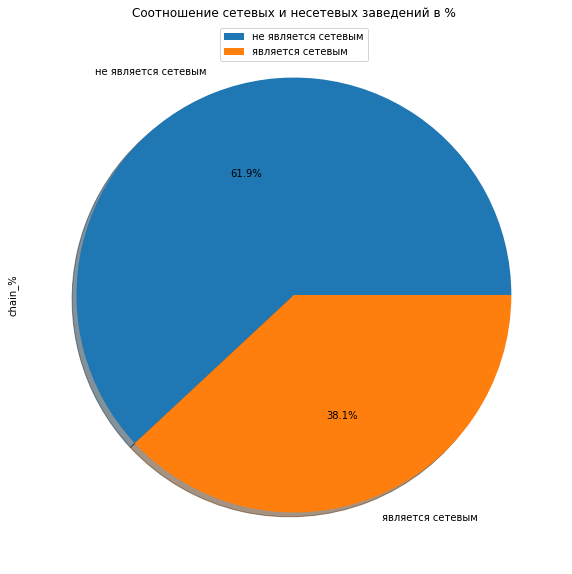

In [21]:
chain2.plot(kind='pie', x='chain', y='chain_%',  
                 figsize=(15, 10),
                 autopct='%1.1f%%',
                 shadow=True, labels=('не является сетевым', 'является сетевым'))
plt.legend(loc=9, fontsize=10)
plt.title('Cоотношение сетевых и несетевых заведений в %')
plt.show()

Около 61% заведений общественного питания не принадлежат ни одной из сетей, сетевыми являются только 38% заведений. 

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Соотношение лучше продемонстрировать на круговой диаграмме.
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер!
</div>

In [22]:
category_chain = data.groupby(['category', 'chain'], \
                        as_index = False)[['name']].count().sort_values(by='name', ascending=False)
category_chain['chain'] = (category_chain['chain']
                           .apply(lambda x: 'является сетевым' if x == 1 else 'не является сетевым'))
category_chain['chain_%'] = category_chain['name']* 100 / len(data['name'])
#category_chain

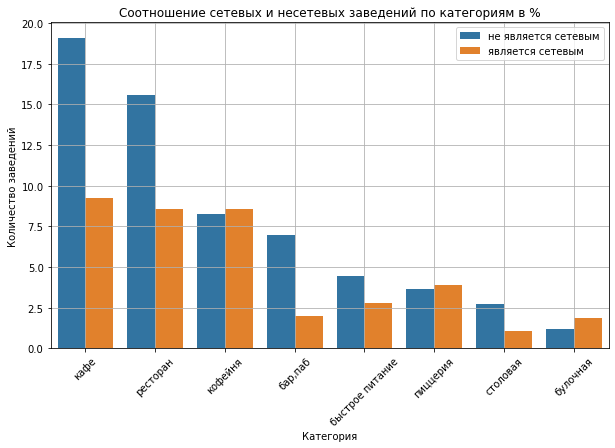

In [23]:
#sns.set_style('dark')
sns.barplot(data=category_chain, x='category', y='chain_%', hue='chain')
plt.xticks(rotation=45)
plt.grid()
plt.legend(fontsize=10)
plt.gcf().set_size_inches(10, 6)
plt.title('Cоотношение сетевых и несетевых заведений по категориям в %')
plt.xlabel('Категория')
plt.ylabel('Количество заведений');

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>Необходимо исправить❌:</b>
Графики обязательно сортируем.
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> +
</div>

Среди кофеен, пиццерий и булочных - сетевых заведений немного больше, самостоятельных заведений много среди кафе, ресторанов и баров с пабами, заведений быстрого питания и столовых. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Совершенно верно!
</div>

In [24]:
data_set = data_copy
data_set = data_set[(data_set['chain'] != 0)]

In [25]:
data_name = (data_set.groupby(['name', 'category'])
             .agg({'rating' : 'median', 'address' : 'count',
                   'seats' : 'median'}).reset_index()
     )

In [26]:
display(data_name.sort_values(by='address', ascending=False).head(15))
data_bar = data_name.sort_values(by='address', ascending=False).head(15)
#data_bar['seats'].median()

,name,category,rating,address,seats
1142,Шоколадница,кофейня,4.2,119,96.0
504,Домино'с Пицца,пиццерия,4.2,76,40.0
497,Додо Пицца,пиццерия,4.3,74,52.0
206,One Price Coffee,кофейня,4.2,71,99.5
1158,Яндекс Лавка,ресторан,4.0,69,46.0
73,Cofix,кофейня,4.1,65,87.5
242,Prime,ресторан,4.2,49,97.0
558,КОФЕПОРТ,кофейня,4.2,42,85.0
644,Кулинарная лавка братьев Караваевых,кафе,4.4,39,70.0
978,Теремок,ресторан,4.1,36,87.5


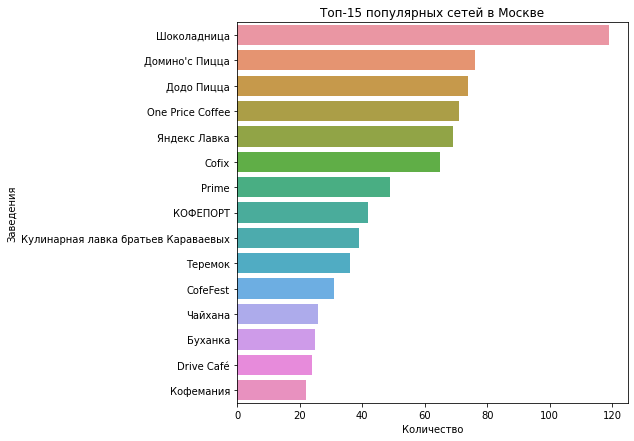

In [27]:
x = data_bar['address']
y = data_bar['name'] 
sns.barplot(x = x, y = y)
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество')
plt.ylabel('Заведения')
plt.gcf().set_size_inches(7,7)

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Отлично!
</div>

In [28]:
fig = px.bar(data_bar.sort_values(by='address', ascending=True), color='category', x='name', y='address')
fig.update_layout(title='Топ-15 популярных сетей распределеных по категориям заведений',
                   xaxis_title='Количество',  
                   yaxis_title='Заведения')
fig.update_xaxes(tickangle=45)
fig.show() 

Многие сети известны за пределами Москвы. У всех сетей общий рейтинг не меньше 4, из 15 заведений 6 являются кофейнями, 3 кафе и ресторана, 2 пиццерии и 1 булочная. Количество мест в среднем от 50 до 120.   

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Прекрасно!
</div>

In [29]:
data_rai = (data.groupby(['district'])
             .agg({'rating' : 'count'}).reset_index().sort_values(by='rating', ascending=False)
           )
data_ra = (data.groupby(['district', 'category'])
             .agg({'rating' : 'count'}).reset_index().sort_values(by='rating', ascending=False)
     )
data_rai #

,district,rating
5,Центральный административный округ,2195
3,Северо-Восточный административный округ,888
2,Северный административный округ,875
8,Южный административный округ,873
1,Западный административный округ,824
0,Восточный административный округ,785
6,Юго-Восточный административный округ,712
7,Юго-Западный административный округ,704
4,Северо-Западный административный округ,409


In [30]:
fig = px.bar(data_ra, color='category', x='rating', y='district')
fig.update_layout(title='Распределение категорий заведений по административным районам',
                   xaxis_title='Количество',  
                   yaxis_title='Административные районы')
fig.update_xaxes(tickangle=45)
fig.show() 

Самое большое скоплений заведений общественного питания находится в Центральном административном округе, а вот Северо-Западный административный округ не является настолько популярным.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

In [31]:
data_cr = (data.groupby(['category'])
             .agg({'rating' : 'mean'})).reset_index().sort_values(by='rating', ascending=False)
data_cr

,category,rating
0,"бар,паб",4.389204
5,пиццерия,4.301763
6,ресторан,4.289685
4,кофейня,4.277459
1,булочная,4.267323
7,столовая,4.211218
3,кафе,4.122772
2,быстрое питание,4.049750


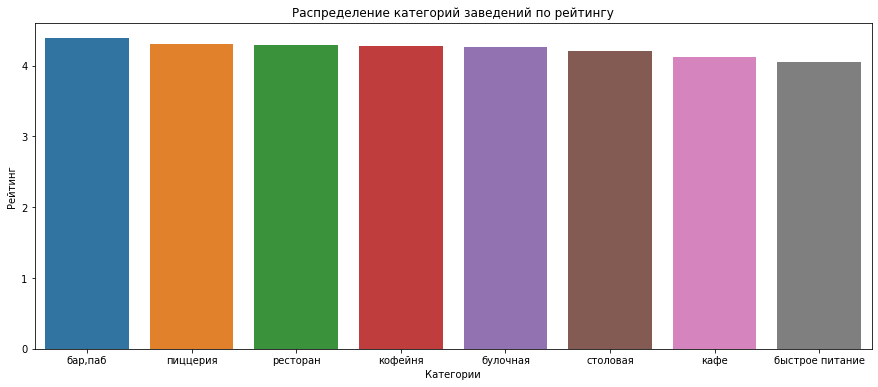

In [32]:
x = data_cr['category']
y = data_cr['rating'] 
sns.barplot(x = x, y = y)
plt.title('Распределение категорий заведений по рейтингу')
plt.xlabel('Категории')
plt.ylabel('Рейтинг')
plt.gcf().set_size_inches(15,6);

Разницы в рейтингах не сильная, но она есть. Клиенты склонны оставлять высокие оценки барам с пабами, и  менее высокие заведениям быстрого питания.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо!
</div>

In [33]:
rating_di = data.groupby('district', as_index=False)['rating'].agg('median')
rating_di.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [34]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)    
#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

In [35]:
# импортируем карту и хороплет
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_di,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

In [36]:
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1);

In [37]:
# выводим карту
m

Наилучшие оценки получают заведения в Центральном административном округе, самые низкие оценки в  Северо-Восточном и Юго-Восточном административных округах.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Супер!
</div>

In [38]:
data_street = (data.groupby(['street'])
             .agg({'name' : 'count'}).reset_index()
     )

In [39]:
display(data_street.sort_values(by='name', ascending=False).head(15))

data_ex = (
    data.query('street in ["проспект Мира", "проспект Вернадского", "Профсоюзная улица",  "Каширское шоссе","Дмитровское шоссе", "Ленинский проспект", "Ленинградский проспект", "Ленинградское шоссе","Варшавское шоссе", "Ярцевская улица", "Новоясеневский проспект","улица Вавилова", "Пятницкая улица", "Кутузовский проспект", "Люблинская улица"]')
              )

data_street_3 = (data_ex.groupby(['street', 'category']).agg({'name' : 'count'}).reset_index())


,street,name
1038,проспект Мира,184
760,Профсоюзная улица,122
515,Ленинский проспект,101
1035,проспект Вернадского,97
364,Дмитровское шоссе,88
445,Каширское шоссе,77
292,Варшавское шоссе,73
513,Ленинградский проспект,72
514,Ленинградское шоссе,70
536,Люблинская улица,60


In [40]:
fig = px.bar(data_street_3.sort_values(by='name', ascending=False)
             .head(60), color='category', x='name', y='street')
fig.update_layout(title='Распределение категорий заведений топ-15 улиц',
                   xaxis_title='Количество',  
                   yaxis_title='Улицы')

fig.show() 

Проспект Мира, Профсоюзная улица, Ленинский проспект являются наиболее популярными точками для открытия заведений общественного питания.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Задание выполнено верно!
</div>

In [41]:
#доделать
data_street_1 = (data.groupby(['street'])
             .agg({'name' : 'count', 'rating' : 'median',
                   'seats' : 'median',  'lat' : 'median', 'lng': 'median', 'chain' : 'median'})
     )

In [42]:
data_street_1.sort_values(by='name', ascending=True).head(60)
data_street_2 = data_street_1[data_street_1['name'] < 2]
#data_street_2.head()
print('Общий рейтинг единственных заведений на улице', data_street_2['rating'].median(),
      'и не сильно отличается от данных среднего рейтинга по заведениям ')
print('Средние количество мест', data_street_2['seats'].median())
#print(data_street_2['name'].count())

Общий рейтинг единственных заведений на улице 4.3 и не сильно отличается от данных среднего рейтинга по заведениям 
Средние количество мест 45.0


In [43]:
chain1 = (data_street_2.pivot_table(index=['chain'], values='name', aggfunc='count')
            .sort_values(by='name', ascending=False).reset_index()
           )
chain1['chain'] = chain1['chain'].apply(lambda x: 'является сетевым' if x == 1 else 'не является сетевым')
chain1['chain_%'] = ((chain1['name']* 100) / data_street_2['name'].count())

print(chain1)

                 chain  name    chain_%
0  не является сетевым   314  73.193473
1     является сетевым   115  26.806527


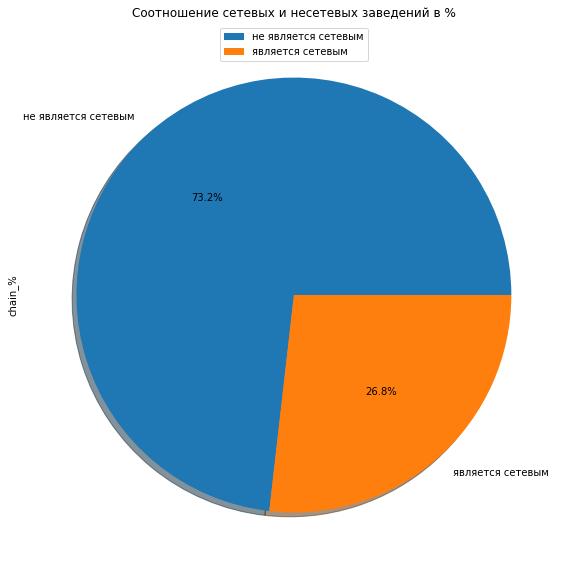

In [44]:
chain1.plot(kind='pie', x='chain', y='chain_%',  
                 figsize=(15, 10),
                 autopct='%1.1f%%',
                 shadow=True, labels=('не является сетевым', 'является сетевым'))
plt.legend(loc=9, fontsize=10)
plt.title('Cоотношение сетевых и несетевых заведений в %')
plt.show()

Среди одиночных заведений куда более преобладают не сетевые заведения чем в общих данных.

In [45]:
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster1 = MarkerCluster().add_to(m1)
def create_clusters1(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster1)

data_street_2.apply(create_clusters1, axis=1);
print(m1)

In [46]:
m1

Какого-то конкретного места скопления заведений нет, распределение нормальное и стремится к центру.  

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, что провел исследования по данным улицам!
</div>

In [47]:
rating_mean = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
rating_mean.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,444.5


In [48]:
m_m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_mean,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный значения средних чеков заведений по районам',
).add_to(m_m)

In [49]:
m_m

Большой разрыв с остальными округами у Центрального и Западного административного округа в 300 рублей, дальше разрыв в цене постепенно снижается на 50 рублей. Цена зависит скорее от самого района и какие точки притяжения для потенциальных клиентов у них есть.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Решение на этом шаге является полностью правильным.
</div>

## Исследование перспектив открытия кофейни.

In [50]:
coffee_house = data.query('category == "кофейня"')

In [51]:
mc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster2 = MarkerCluster().add_to(mc)
def create_clusters2(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster2)

coffee_house.apply(create_clusters2, axis=1);

In [52]:
print('Расположения кофеен в Москве')
mc

Расположения кофеен в Москве


In [53]:
print('В Москве около', coffee_house['category'].count(), "кофеен.")
coffe_count =  (
    coffee_house.pivot_table(index=['district'], values='category', aggfunc='count')
    .sort_values(by='category', ascending=False).reset_index()
    )

coffe_count['count_%'] = coffe_count['category'] / 731 * 100
coffe_count.sort_values(by='category', ascending=False)

В Москве около 1393 кофеен.


,district,category,count_%
0,Центральный административный округ,422,57.729138
1,Северный административный округ,186,25.444596
2,Северо-Восточный административный округ,159,21.751026
3,Западный административный округ,146,19.972640
4,Южный административный округ,130,17.783858
5,Восточный административный округ,104,14.227086
6,Юго-Западный административный округ,95,12.995896
7,Юго-Восточный административный округ,89,12.175103
8,Северо-Западный административный округ,62,8.481532


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Совершенно верно!
</div>

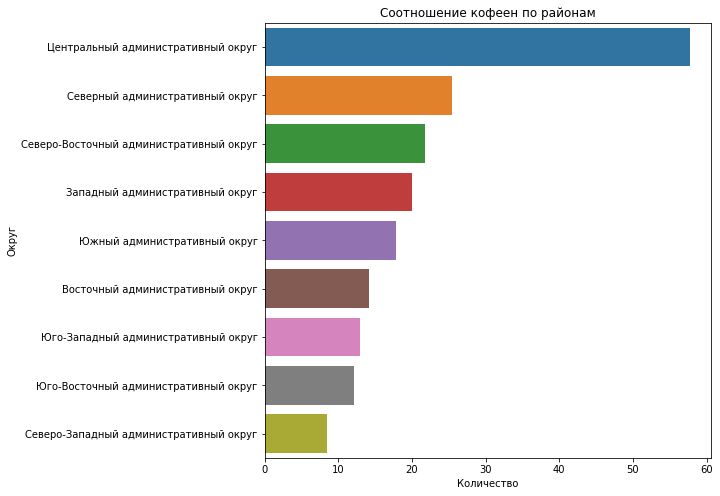

In [54]:
x = coffe_count['district']
y = coffe_count['count_%'] 
sns.barplot(x = y, y = x)
plt.title('Соотношение кофеен по районам')
plt.xlabel('Количество')
plt.ylabel('Округ')
plt.gcf().set_size_inches(8,8);

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Можно лучше⚠️:</b> Круговые диаграммы рекомендую использовать, если количество категорий не превышает 4 - 5, в данном случае она выглядит малоинформативной.
        
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Вижу, поправил:)
</div>

Наибольшие количества кофеен находится в Центральном, Северном и Северо-Восточном административных округах. В центральном районе их количество значительна выше и составляет 30% от всех кофеен в городе.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Верный вывод!
</div>



In [55]:
cd = coffee_house.groupby('is_24/7', as_index=False)['category'].agg('count')
cd

,is_24/7,category
0,False,1334
1,True,59


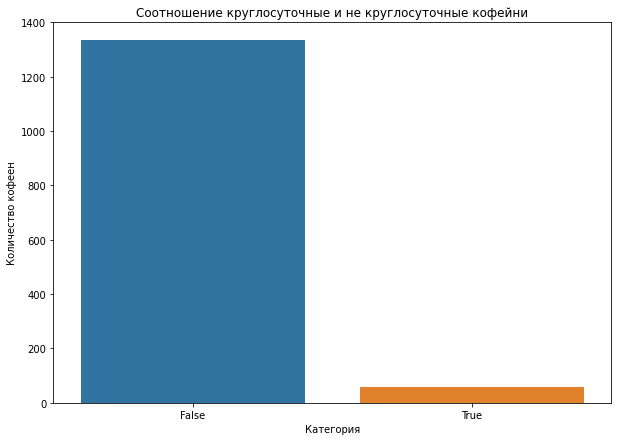

In [56]:
sns.barplot(y = cd['category'], x = cd['is_24/7'])
plt.title('Cоотношение круглосуточные и не круглосуточные кофейни')
plt.xlabel('Категория')
plt.ylabel('Количество кофеен')
plt.gcf().set_size_inches(10,7);

Количество круглосуточных кофеин не значительно.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Согласна! 
</div>



In [57]:
rating_cf = (coffee_house.groupby('district', as_index=False)['rating']
             .agg('median').sort_values(by='rating', ascending=False)
            )
rating_cf

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


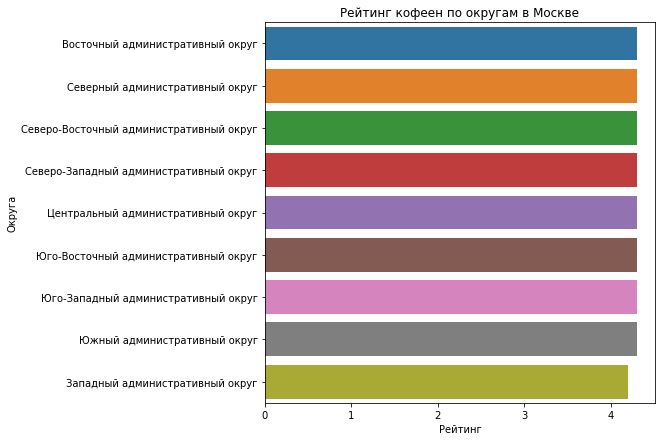

In [58]:
x = rating_cf['rating']
y = rating_cf['district'] 
sns.barplot(x = x, y = y)
plt.title('Рейтинг кофеен по округам в Москве')
plt.xlabel('Рейтинг')
plt.ylabel('Округа')
plt.gcf().set_size_inches(7,7)

Рейтинг кофеен по округам практически не различается.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошо!
</div>



In [59]:
coffe_mean = (coffee_house.groupby('district', as_index=False)['middle_coffee_cup']
              .agg('median').sort_values(by='middle_coffee_cup', ascending=False))
coffee_house['middle_coffee_cup'].median()

170.0

In [60]:
coffe_mean

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


В среднем чашка капучино стоит 170 рублей, наибольшая средняя цена в Юго-Западный административный округ(198 рублей), наименьшая в Восточный административный округ (135 рублей).  

Наибольшие количество кофеен находится в Центральный административный округ, средняя чашка кофе там 190 рублей в этом округе могут быть большая выручка, но и высокая конкуренция в связи с большим количеством заведений, поэтому стоить обратить внимание на Юго-Западный административный округ там достаточно низкое количества заведений, а цена за чашку кофеин самая высокая среди округов и составляет 198 рублей. Средний рейтинг у обоих 4.3. Для понимания нужно ли делать кофейню круглосуточной нужны дополнительные исследования чтобы понять насколько постоянный поток людей в течении суток на улице, по общим данным круглосуточных кофеин не много.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Согласна!
</div>



## Общий вывод

Для выбора в какой потенциально популярный заведения общественного питания стоит сделать вложения и  выборе подходящего инвесторам места. нужна ориентироваться на понимания того что:

- Топ три заведений для вложений бизнеса по популярности эта кафе, рестораны и кофейни.
- Наибольшее количество мест для потока посетителей требуется для ресторанов (90 мест), а наименьшие для булочных (50 мест). У кофеин тоже большой поток клиентов там количество мест рассчитывается в среднем на 80 мест.
- Самое большое скоплений заведений общественного питания находится в Центральном административном округе, а вот Северо-Западный административный округ не является настолько популярным и имеет наименьшее количество заведений.
- Наилучшие оценки получают заведения в Центральном административном округе, самые низкие оценки в Северо-Восточном и Юго-Восточном административных округах. Клиенты склонны оставлять высокие оценки барам с пабами, пиццериям и ресторанам, наименьшие оценки у заведениям быстрого питания.
- Около 61% заведений общественного питания не принадлежат ни одной из сетей, сетевыми являются только 38% заведений. Среди кофеен, пиццерий и булочных - сетевых заведений немного больше, самостоятельных заведений много среди кафе, ресторанов и баров с пабами, заведений быстрого питания и столовых.
- Наибольшее количество заведений стремится к центру, наименьшие их количество на окраинах города где потенциальных клиентов меньше.
- Средняя значение чека высокие у Центрального и Западного административного округа, разрыв с остальными округами в 300 рублей, дальше разрыв в цене постепенно снижается на 50 рублей. Цена зависит скорее от самого района и какие точки притяжения для потенциальных клиентов у них есть.

Наиболее прибыльным для открытия бизнеса являются Центральный и Западный административные округа. В них средняя значение чека равна 1000 рублей в этих округах большая выручка, но в Центральном высокая концентрация конкурентов, поэтому стоить обратить внимание на Западный округ там расположено достаточно низкое количества заведений. Для заведений стоит рассчитывать на не менее 80 мест с потенциалом для расширения в будущем.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Обоснованно!
</div>



Презентация: <https://disk.yandex.ru/i/2OzwE03x0eOPFA> 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Хорошая презентация получилась!
</div>



<div style="border:solid Chocolate 2px; padding: 40px">
Игорь, давай подведем итоги. Ты большой молодец, что старался и проделал такую большую работу. Мне понравилось, что ты наполнил работу развернутыми выводами и наглядно продемонстрировал каждое задание:)
    
    Разберем над чем стоит поработать:

    1. Добавить таблицу с новыми столбцами.

    2. Делая предобработку данных, не забывай про неявные дубликаты.

    3. Составляя диаграммы, оценивай как бы они выглядели информативнее.

    4. Не забывай про сортировку.

    
    Пересмотри работу и исправь ошибки. Обязательно пиши, если я могу тебе еще чем-то помочь. Удачи!)
  

<div class="alert alert-success">
<h2> Комментарий ревьюера v2<a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Игорь, привет еще раз! Молодец, оперативно откорректировал проект. Работа принята, удачи в обучении:)
</div>